In [ ]:
import tensorflow as tf
from tensorflow.keras import layers
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm

In [ ]:
# (xtr,_),(_,_)=tf.keras.datasets.cifar100.load_data()
# if xtr.shape[-1]==1:
#   xtr=np.expand_dims(xtr,-1)
# xtr=xtr/255.
# xtr=(xtr-0.5)*2
# print(xtr.shape)

# data

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive/')

Mounted at /content/gdrive/


In [ ]:
!mkdir data_faces && wget https://s3-us-west-1.amazonaws.com/udacity-dlnfd/datasets/celeba.zip 

--2020-10-08 07:08:31--  https://s3-us-west-1.amazonaws.com/udacity-dlnfd/datasets/celeba.zip
Resolving s3-us-west-1.amazonaws.com (s3-us-west-1.amazonaws.com)... 52.219.120.88
Connecting to s3-us-west-1.amazonaws.com (s3-us-west-1.amazonaws.com)|52.219.120.88|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1443490838 (1.3G) [application/zip]
Saving to: ‘celeba.zip’

celeba.zip          100%[===================>]   1.34G  56.3MB/s    in 22s     

2020-10-08 07:08:53 (62.8 MB/s) - ‘celeba.zip’ saved [1443490838/1443490838]



In [ ]:
import zipfile

with zipfile.ZipFile("celeba.zip","r") as zip_ref:
  zip_ref.extractall("data_faces/")

In [ ]:
import os
root = 'data_faces/img_align_celeba'
img_list = os.listdir(root)
print(len(img_list))

202599


In [ ]:
datagen=tf.keras.preprocessing.image.ImageDataGenerator(rescale=1/255.)

In [ ]:
train_generator = datagen.flow_from_directory(
    directory='data_faces/',
    color_mode="rgb",
    batch_size=128,
    class_mode="categorical",
    shuffle=True,
    seed=42,
    target_size=(128,128)
)

Found 202599 images belonging to 1 classes.


In [ ]:
print(len(train_generator))
print(train_generator[0][0].shape)

1583
(128, 128, 128, 3)


In [ ]:
# traindataset=tf.data.Dataset.from_tensor_slices(xtr).shuffle(50000).batch(128)
# len(traindataset)

In [ ]:
def showout(x):
  x=(x+1)*0.5
  fig=plt.figure(figsize=(10,10))
  for i in range(25):
      fig.add_subplot(5,5,i+1)
      plt.imshow(x[i][:,:,:])
  plt.show()

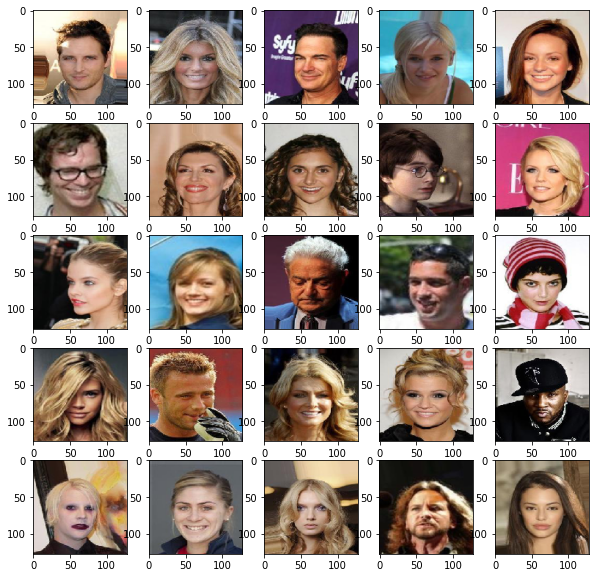

In [ ]:
tensor=train_generator[2][0][:25]
showout((tensor-0.5)*2.)

In [ ]:
def get_generator():
  gen=tf.keras.Sequential(
      [
       layers.Dense(4*4*512,input_shape=(100,)),
       layers.BatchNormalization(),
       layers.ReLU(),
       layers.Reshape((4,4,512)),

       
       layers.Conv2DTranspose(256,3,2,'same'),
       layers.BatchNormalization(),
       layers.ReLU(),

       layers.Conv2DTranspose(128,3,2,'same'),
       layers.BatchNormalization(),
       layers.ReLU(),

       layers.Conv2DTranspose(64,3,2,'same'),
       layers.BatchNormalization(),
       layers.ReLU(),

       layers.Conv2DTranspose(32,3,2,'same'),
       layers.BatchNormalization(),
       layers.ReLU(),

       layers.Conv2DTranspose(3,3,2,'same',activation='tanh')
      ]
  )
  return gen

In [ ]:
gen=get_generator()
gen.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8192)              827392    
_________________________________________________________________
batch_normalization (BatchNo (None, 8192)              32768     
_________________________________________________________________
re_lu (ReLU)                 (None, 8192)              0         
_________________________________________________________________
reshape (Reshape)            (None, 4, 4, 512)         0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 8, 8, 256)         1179904   
_________________________________________________________________
batch_normalization_1 (Batch (None, 8, 8, 256)         1024      
_________________________________________________________________
re_lu_1 (ReLU)               (None, 8, 8, 256)         0

In [ ]:
def get_discriminator():
  dis=tf.keras.Sequential(
      [
       layers.Conv2D(64,3,2,'same',input_shape=(128,128,3)),
       layers.BatchNormalization(),
       layers.LeakyReLU(),

       layers.Conv2D(128,3,2,'same'),
       layers.BatchNormalization(),
       layers.LeakyReLU(),

       layers.Conv2D(128,3,2,'same'),
       layers.BatchNormalization(),
       layers.LeakyReLU(),

       layers.Flatten(),
       layers.Dense(1)
      ]
  )
  return dis

In [ ]:
dis=get_discriminator()
dis.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_3 (Conv2D)            (None, 64, 64, 64)        1792      
_________________________________________________________________
batch_normalization_8 (Batch (None, 64, 64, 64)        256       
_________________________________________________________________
leaky_re_lu_3 (LeakyReLU)    (None, 64, 64, 64)        0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 32, 32, 128)       73856     
_________________________________________________________________
batch_normalization_9 (Batch (None, 32, 32, 128)       512       
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (None, 32, 32, 128)       0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 16, 16, 128)      

In [ ]:
testgeneration=gen(tf.random.normal((25,100)))
print(testgeneration.shape)

(25, 128, 128, 3)


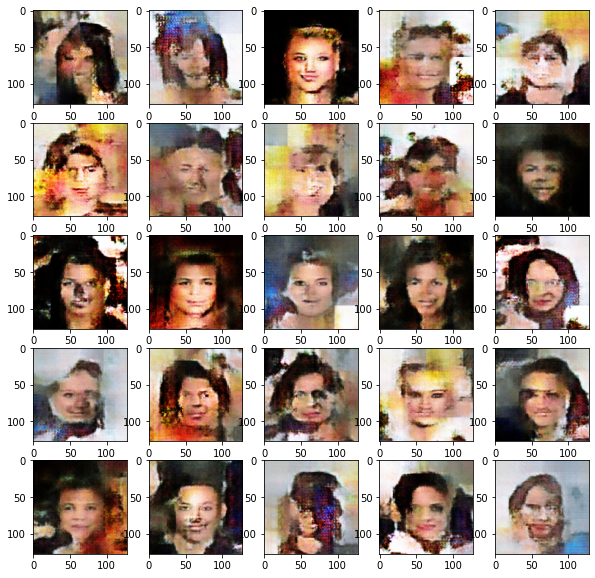

In [ ]:
showout(testgeneration)

In [ ]:
disopt=tf.keras.optimizers.Adam(0.0002,0.5,0.999)
genopt=tf.keras.optimizers.Adam(0.0002,0.5,0.999)

In [ ]:
criticsteps=5
c_lambda=1

In [ ]:
seed=tf.random.normal((25,100))

In [ ]:
@tf.function
def train_step(real):
  for i in range(criticsteps):
    with tf.GradientTape() as distape,tf.GradientTape() as gradpentape:
      noise1=tf.random.normal((len(real),100))
      fake1=gen(noise1)
      realout1=dis(real)
      fakeout1=dis(fake1)

      epsilon=tf.cast(tf.random.normal((len(real),1,1,1)),tf.float32)
      real=tf.cast(real,tf.float32)
      fake1=tf.cast(fake1,tf.float32)
      merged=real*epsilon+fake1*(1.-epsilon)
      #merged=tf.math.multiply(epsilon,real)+tf.math.multiply((1-epsilon),fake1)
      mergedout=dis(merged)
      grads_for_penalty=gradpentape.gradient(mergedout,merged)
      grads_for_penalty=tf.reshape(grads_for_penalty,(len(grads_for_penalty),-1))
      grads_for_penalty=tf.norm(grads_for_penalty,2,1)
      #print(grads_for_penalty.shape,"------------grads_for_penalty after norm")
      gradientpenalty=c_lambda*tf.math.reduce_mean((grads_for_penalty-1.0)**2)

      disloss=tf.math.reduce_mean(fakeout1)-tf.math.reduce_mean(realout1)+gradientpenalty
      disgrads=distape.gradient(disloss,dis.trainable_variables)
      disopt.apply_gradients(zip(disgrads,dis.trainable_variables))
  with tf.GradientTape() as gentape:
    noise2=tf.random.normal((len(real),100))
    fake2=gen(noise2)
    fakeout2=dis(fake2)
    genloss=-tf.math.reduce_mean(fakeout2)
    gengrads=gentape.gradient(genloss,gen.trainable_variables)
    genopt.apply_gradients(zip(gengrads,gen.trainable_variables))
    return disloss,genloss




  0%|          | 0/1583 [00:00<?, ?it/s]

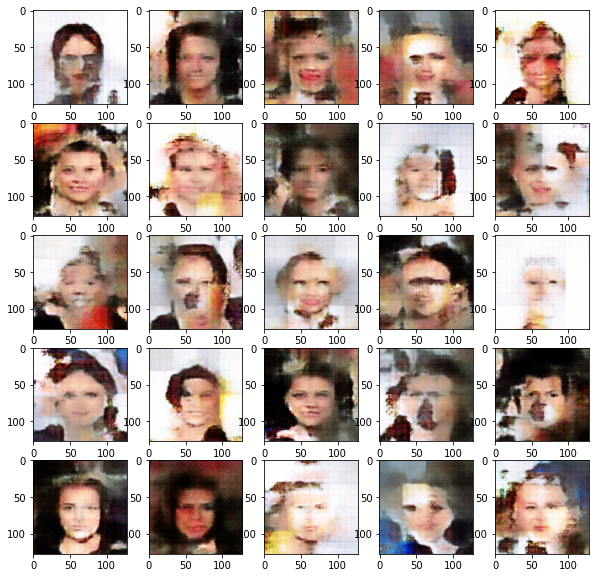

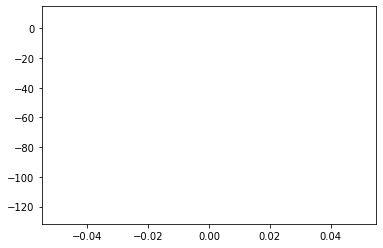



  0%|          | 1/1583 [00:10<4:44:12, 10.78s/it]

  0%|          | 2/1583 [00:11<3:28:15,  7.90s/it]

  0%|          | 3/1583 [00:13<2:38:17,  6.01s/it]

  0%|          | 4/1583 [00:15<2:03:18,  4.69s/it]

  0%|          | 5/1583 [00:16<1:38:50,  3.76s/it]

  0%|          | 6/1583 [00:18<1:21:46,  3.11s/it]

  0%|          | 7/1583 [00:19<1:09:50,  2.66s/it]

  1%|          | 8/1583 [00:21<1:01:32,  2.34s/it]

  1%|          | 9/1583 [00:23<55:44,  2.13s/it]  

  1%|          | 10/1583 [00:24<51:42,  1.97s/it]

  1%|          | 11/1583 [00:26<48:52,  1.87s/it]

  1%|          | 12/1583 [00:28<46:57,  1.79s/it]

  1%|          | 13/1583 [00:29<45:35,  1.74s/it]

  1%|          | 14/1583 [00:31<44:41,  1.71s/it]

  1%|          | 15/1583 [00:32<44:04,  1.69s/it]

  1%|          | 16/1583 [00:34<43:38,  1.67s/it]

  1%|          | 17/1583 [00:36<43:22,  1.66s/it]

  1%|          | 18/1583 [00:37<43:11,  1.66s/it]

  1%|          | 19/1583 [00:39<43:05,  1.65s/it]

  1%|▏         | 20/

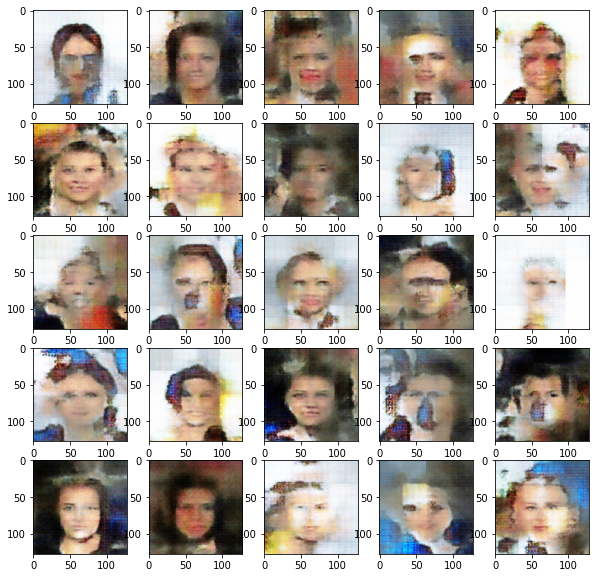

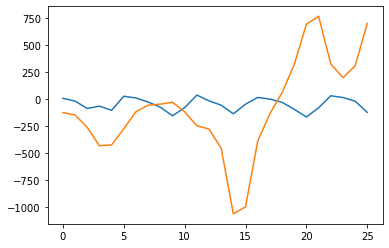



  2%|▏         | 26/1583 [00:53<1:05:54,  2.54s/it]

  2%|▏         | 27/1583 [00:55<55:42,  2.15s/it]  

  2%|▏         | 28/1583 [00:56<51:30,  1.99s/it]

  2%|▏         | 29/1583 [00:58<48:32,  1.87s/it]

  2%|▏         | 30/1583 [01:00<46:26,  1.79s/it]

  2%|▏         | 31/1583 [01:01<44:58,  1.74s/it]

  2%|▏         | 32/1583 [01:03<43:55,  1.70s/it]

  2%|▏         | 33/1583 [01:04<43:09,  1.67s/it]

  2%|▏         | 34/1583 [01:06<42:36,  1.65s/it]

  2%|▏         | 35/1583 [01:08<42:12,  1.64s/it]

  2%|▏         | 36/1583 [01:09<41:54,  1.63s/it]

  2%|▏         | 37/1583 [01:11<41:39,  1.62s/it]

  2%|▏         | 38/1583 [01:12<41:30,  1.61s/it]

  2%|▏         | 39/1583 [01:14<41:23,  1.61s/it]

  3%|▎         | 40/1583 [01:16<41:16,  1.61s/it]

  3%|▎         | 41/1583 [01:17<41:12,  1.60s/it]

  3%|▎         | 42/1583 [01:19<41:07,  1.60s/it]

  3%|▎         | 43/1583 [01:20<41:05,  1.60s/it]

  3%|▎         | 44/1583 [01:22<41:02,  1.60s/it]

  3%|▎         | 45/1583 

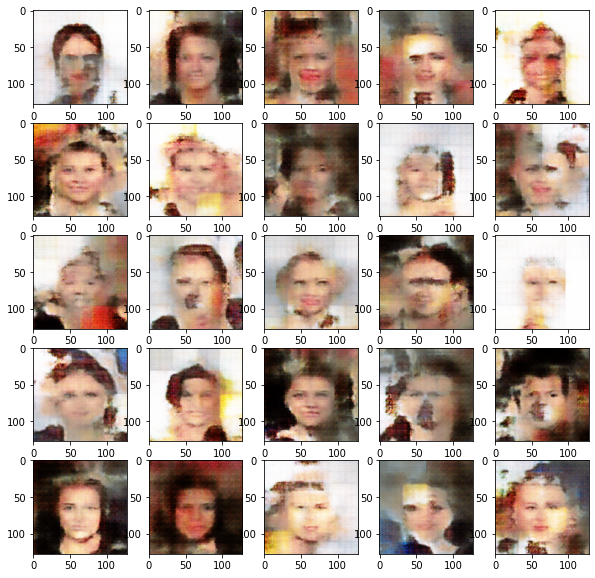

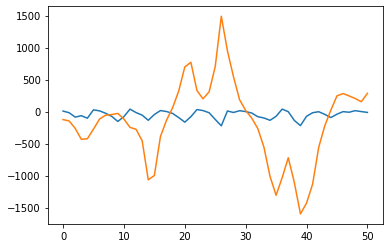



  3%|▎         | 51/1583 [01:36<1:01:21,  2.40s/it]

  3%|▎         | 52/1583 [01:37<52:09,  2.04s/it]  

  3%|▎         | 53/1583 [01:39<48:42,  1.91s/it]

  3%|▎         | 54/1583 [01:40<46:15,  1.82s/it]

  3%|▎         | 55/1583 [01:42<44:32,  1.75s/it]

  4%|▎         | 56/1583 [01:43<43:20,  1.70s/it]

  4%|▎         | 57/1583 [01:45<42:31,  1.67s/it]

  4%|▎         | 58/1583 [01:47<41:57,  1.65s/it]

  4%|▎         | 59/1583 [01:48<41:32,  1.64s/it]

  4%|▍         | 60/1583 [01:50<41:14,  1.63s/it]

  4%|▍         | 61/1583 [01:51<41:02,  1.62s/it]

  4%|▍         | 62/1583 [01:53<40:54,  1.61s/it]

  4%|▍         | 63/1583 [01:55<40:51,  1.61s/it]

  4%|▍         | 64/1583 [01:56<40:48,  1.61s/it]

  4%|▍         | 65/1583 [01:58<40:47,  1.61s/it]

  4%|▍         | 66/1583 [01:59<40:46,  1.61s/it]

  4%|▍         | 67/1583 [02:01<40:45,  1.61s/it]

  4%|▍         | 68/1583 [02:03<40:43,  1.61s/it]

  4%|▍         | 69/1583 [02:04<40:41,  1.61s/it]

  4%|▍         | 70/1583 

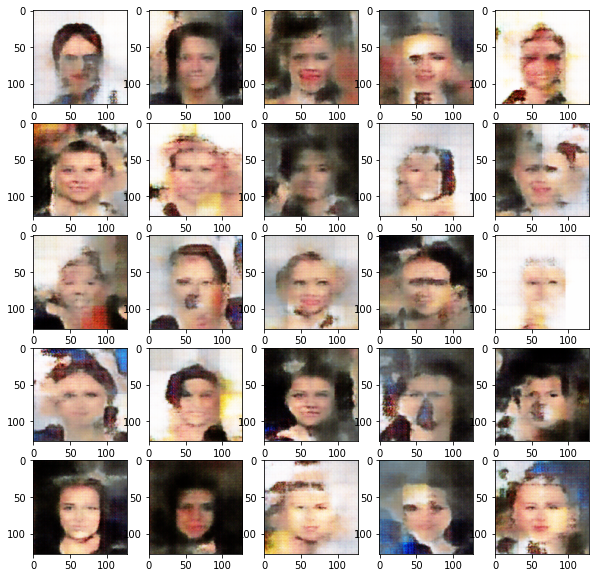

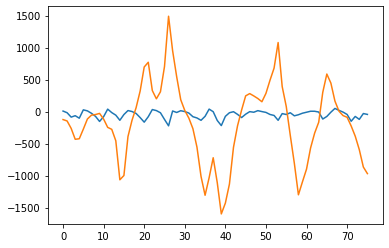



  5%|▍         | 76/1583 [02:19<1:02:43,  2.50s/it]

  5%|▍         | 77/1583 [02:20<52:52,  2.11s/it]  

  5%|▍         | 78/1583 [02:21<49:04,  1.96s/it]

  5%|▍         | 79/1583 [02:23<46:24,  1.85s/it]

  5%|▌         | 80/1583 [02:25<44:30,  1.78s/it]

  5%|▌         | 81/1583 [02:26<43:11,  1.73s/it]

  5%|▌         | 82/1583 [02:28<42:14,  1.69s/it]

  5%|▌         | 83/1583 [02:29<41:35,  1.66s/it]

  5%|▌         | 84/1583 [02:31<41:07,  1.65s/it]

  5%|▌         | 85/1583 [02:33<40:48,  1.63s/it]

  5%|▌         | 86/1583 [02:34<40:32,  1.63s/it]

  5%|▌         | 87/1583 [02:36<40:24,  1.62s/it]

  6%|▌         | 88/1583 [02:37<40:16,  1.62s/it]

  6%|▌         | 89/1583 [02:39<40:09,  1.61s/it]

  6%|▌         | 90/1583 [02:41<40:06,  1.61s/it]

  6%|▌         | 91/1583 [02:42<40:02,  1.61s/it]

  6%|▌         | 92/1583 [02:44<39:58,  1.61s/it]

  6%|▌         | 93/1583 [02:45<39:56,  1.61s/it]

  6%|▌         | 94/1583 [02:47<39:54,  1.61s/it]

  6%|▌         | 95/1583 

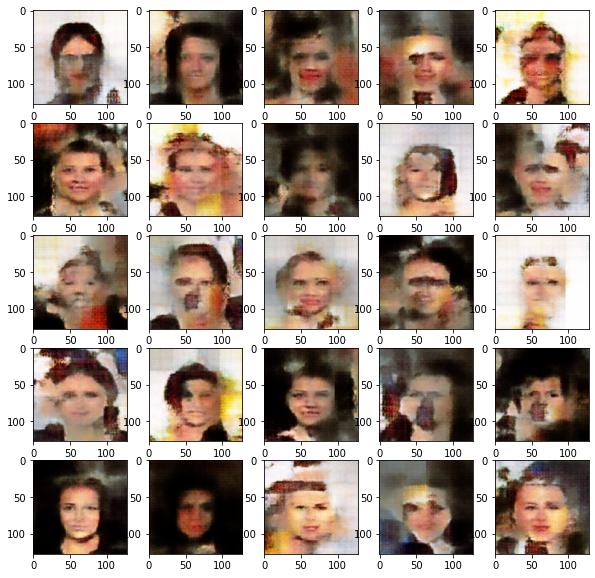

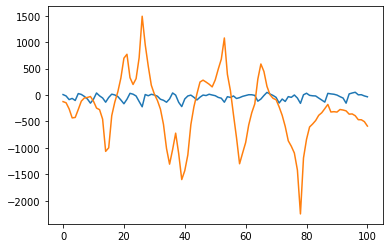



  6%|▋         | 101/1583 [03:01<59:35,  2.41s/it]

  6%|▋         | 102/1583 [03:02<50:36,  2.05s/it]

  7%|▋         | 103/1583 [03:04<47:17,  1.92s/it]

  7%|▋         | 104/1583 [03:05<44:56,  1.82s/it]

  7%|▋         | 105/1583 [03:07<43:15,  1.76s/it]

  7%|▋         | 106/1583 [03:09<42:04,  1.71s/it]

  7%|▋         | 107/1583 [03:10<41:15,  1.68s/it]

  7%|▋         | 108/1583 [03:12<40:43,  1.66s/it]

  7%|▋         | 109/1583 [03:13<40:19,  1.64s/it]

  7%|▋         | 110/1583 [03:15<40:01,  1.63s/it]

  7%|▋         | 111/1583 [03:17<39:46,  1.62s/it]

  7%|▋         | 112/1583 [03:18<39:37,  1.62s/it]

  7%|▋         | 113/1583 [03:20<39:33,  1.61s/it]

  7%|▋         | 114/1583 [03:21<39:27,  1.61s/it]

  7%|▋         | 115/1583 [03:23<39:23,  1.61s/it]

  7%|▋         | 116/1583 [03:25<39:20,  1.61s/it]

  7%|▋         | 117/1583 [03:26<39:18,  1.61s/it]

  7%|▋         | 118/1583 [03:28<39:16,  1.61s/it]

  8%|▊         | 119/1583 [03:29<39:13,  1.61s/it]

  8%|▊    

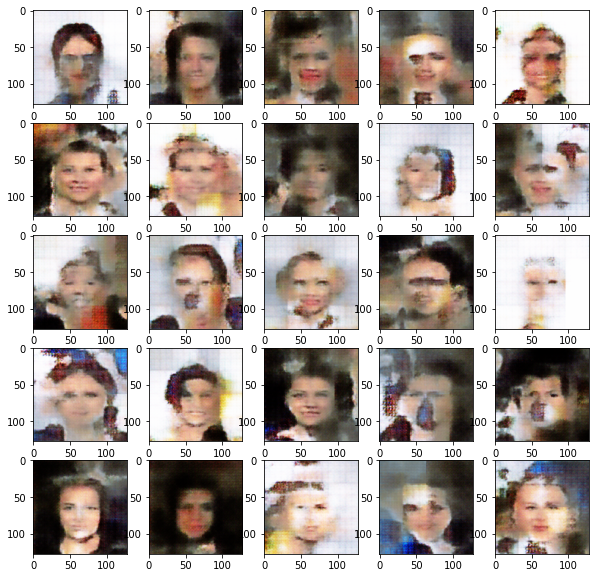

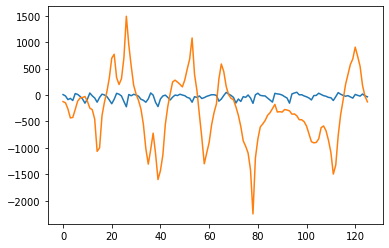



  8%|▊         | 126/1583 [03:44<1:00:00,  2.47s/it]

  8%|▊         | 127/1583 [03:45<50:54,  2.10s/it]  

  8%|▊         | 128/1583 [03:46<47:20,  1.95s/it]

  8%|▊         | 129/1583 [03:48<44:46,  1.85s/it]

  8%|▊         | 130/1583 [03:50<42:58,  1.77s/it]

  8%|▊         | 131/1583 [03:51<41:41,  1.72s/it]

  8%|▊         | 132/1583 [03:53<40:48,  1.69s/it]

  8%|▊         | 133/1583 [03:54<40:12,  1.66s/it]

  8%|▊         | 134/1583 [03:56<39:45,  1.65s/it]

  9%|▊         | 135/1583 [03:58<39:26,  1.63s/it]

  9%|▊         | 136/1583 [03:59<39:13,  1.63s/it]

  9%|▊         | 137/1583 [04:01<39:01,  1.62s/it]

  9%|▊         | 138/1583 [04:02<38:53,  1.61s/it]

  9%|▉         | 139/1583 [04:04<38:49,  1.61s/it]

  9%|▉         | 140/1583 [04:06<38:45,  1.61s/it]

  9%|▉         | 141/1583 [04:07<38:42,  1.61s/it]

  9%|▉         | 142/1583 [04:09<38:39,  1.61s/it]

  9%|▉         | 143/1583 [04:11<38:37,  1.61s/it]

  9%|▉         | 144/1583 [04:12<38:36,  1.61s/it]

  9%|▉

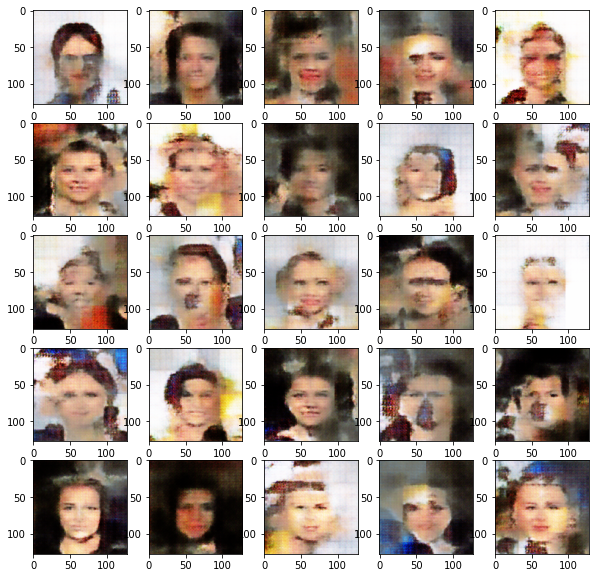

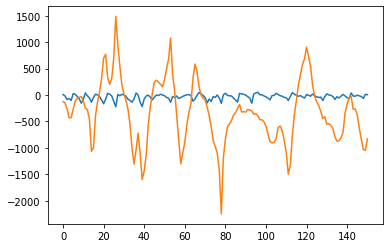



 10%|▉         | 151/1583 [04:26<58:18,  2.44s/it]

 10%|▉         | 152/1583 [04:27<49:22,  2.07s/it]

 10%|▉         | 153/1583 [04:29<46:01,  1.93s/it]

 10%|▉         | 154/1583 [04:31<43:38,  1.83s/it]

 10%|▉         | 155/1583 [04:32<41:58,  1.76s/it]

 10%|▉         | 156/1583 [04:34<40:50,  1.72s/it]

 10%|▉         | 157/1583 [04:35<40:02,  1.68s/it]

 10%|▉         | 158/1583 [04:37<39:26,  1.66s/it]

 10%|█         | 159/1583 [04:39<39:03,  1.65s/it]

 10%|█         | 160/1583 [04:40<38:44,  1.63s/it]

 10%|█         | 161/1583 [04:42<38:31,  1.63s/it]

 10%|█         | 162/1583 [04:43<38:22,  1.62s/it]

 10%|█         | 163/1583 [04:45<38:14,  1.62s/it]

 10%|█         | 164/1583 [04:47<38:09,  1.61s/it]

 10%|█         | 165/1583 [04:48<38:05,  1.61s/it]

 10%|█         | 166/1583 [04:50<38:00,  1.61s/it]

 11%|█         | 167/1583 [04:51<37:59,  1.61s/it]

 11%|█         | 168/1583 [04:53<37:57,  1.61s/it]

 11%|█         | 169/1583 [04:55<37:55,  1.61s/it]

 11%|█    

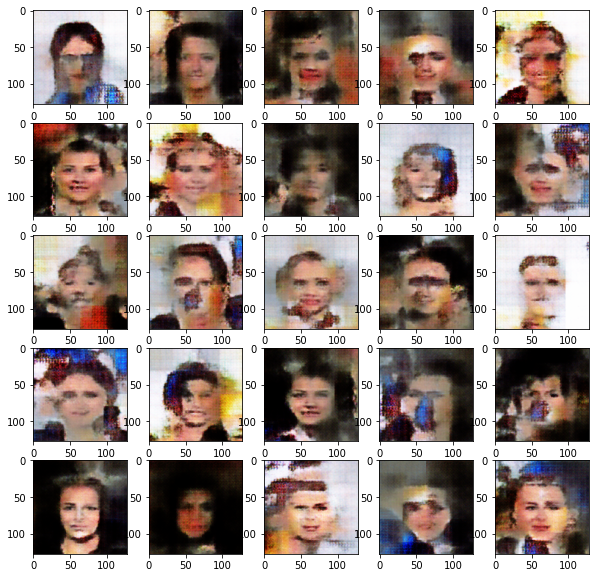

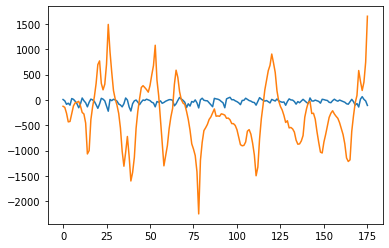



 11%|█         | 176/1583 [05:09<56:45,  2.42s/it]

 11%|█         | 177/1583 [05:10<48:07,  2.05s/it]

 11%|█         | 178/1583 [05:11<44:57,  1.92s/it]

 11%|█▏        | 179/1583 [05:13<42:42,  1.83s/it]

 11%|█▏        | 180/1583 [05:15<41:07,  1.76s/it]

 11%|█▏        | 181/1583 [05:16<40:01,  1.71s/it]

 11%|█▏        | 182/1583 [05:18<39:15,  1.68s/it]

 12%|█▏        | 183/1583 [05:19<38:42,  1.66s/it]

 12%|█▏        | 184/1583 [05:21<38:17,  1.64s/it]

 12%|█▏        | 185/1583 [05:23<38:02,  1.63s/it]

 12%|█▏        | 186/1583 [05:24<37:49,  1.62s/it]

 12%|█▏        | 187/1583 [05:26<37:42,  1.62s/it]

 12%|█▏        | 188/1583 [05:28<37:34,  1.62s/it]

 12%|█▏        | 189/1583 [05:29<37:29,  1.61s/it]

 12%|█▏        | 190/1583 [05:31<37:26,  1.61s/it]

 12%|█▏        | 191/1583 [05:32<37:22,  1.61s/it]

 12%|█▏        | 192/1583 [05:34<37:20,  1.61s/it]

 12%|█▏        | 193/1583 [05:36<37:17,  1.61s/it]

 12%|█▏        | 194/1583 [05:37<37:17,  1.61s/it]

 12%|█▏   

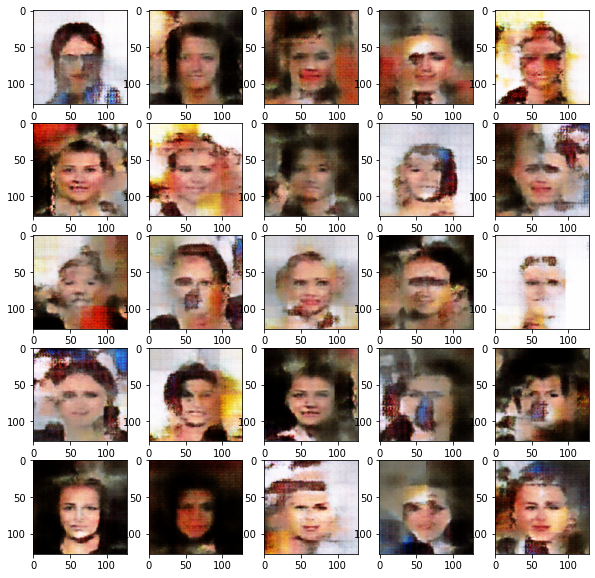

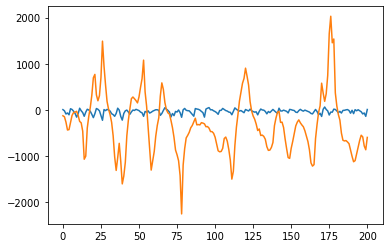



 13%|█▎        | 201/1583 [05:51<57:20,  2.49s/it]

 13%|█▎        | 202/1583 [05:53<48:21,  2.10s/it]

 13%|█▎        | 203/1583 [05:54<44:54,  1.95s/it]

 13%|█▎        | 204/1583 [05:56<42:27,  1.85s/it]

 13%|█▎        | 205/1583 [05:57<40:44,  1.77s/it]

 13%|█▎        | 206/1583 [05:59<39:32,  1.72s/it]

 13%|█▎        | 207/1583 [06:01<38:42,  1.69s/it]

 13%|█▎        | 208/1583 [06:02<38:06,  1.66s/it]

 13%|█▎        | 209/1583 [06:04<37:39,  1.64s/it]

 13%|█▎        | 210/1583 [06:05<37:21,  1.63s/it]

 13%|█▎        | 211/1583 [06:07<37:09,  1.63s/it]

 13%|█▎        | 212/1583 [06:09<36:58,  1.62s/it]

 13%|█▎        | 213/1583 [06:10<36:51,  1.61s/it]

 14%|█▎        | 214/1583 [06:12<36:46,  1.61s/it]

 14%|█▎        | 215/1583 [06:13<36:42,  1.61s/it]

 14%|█▎        | 216/1583 [06:15<36:38,  1.61s/it]

 14%|█▎        | 217/1583 [06:17<36:34,  1.61s/it]

 14%|█▍        | 218/1583 [06:18<36:33,  1.61s/it]

 14%|█▍        | 219/1583 [06:20<36:31,  1.61s/it]

 14%|█▍   

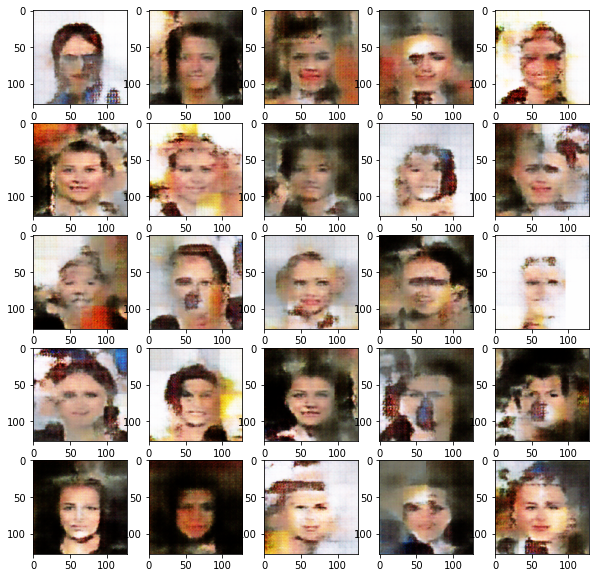

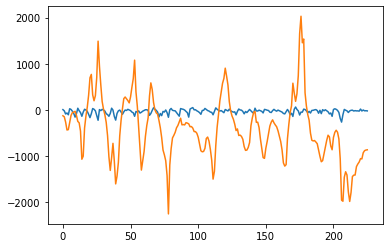



 14%|█▍        | 226/1583 [06:34<54:59,  2.43s/it]

 14%|█▍        | 227/1583 [06:35<46:34,  2.06s/it]

 14%|█▍        | 228/1583 [06:37<43:25,  1.92s/it]

 14%|█▍        | 229/1583 [06:38<41:12,  1.83s/it]

 15%|█▍        | 230/1583 [06:40<39:42,  1.76s/it]

 15%|█▍        | 231/1583 [06:41<38:38,  1.71s/it]

 15%|█▍        | 232/1583 [06:43<37:51,  1.68s/it]

 15%|█▍        | 233/1583 [06:45<37:20,  1.66s/it]

 15%|█▍        | 234/1583 [06:46<36:57,  1.64s/it]

 15%|█▍        | 235/1583 [06:48<36:40,  1.63s/it]

 15%|█▍        | 236/1583 [06:49<36:27,  1.62s/it]

 15%|█▍        | 237/1583 [06:51<36:19,  1.62s/it]

 15%|█▌        | 238/1583 [06:53<36:13,  1.62s/it]

 15%|█▌        | 239/1583 [06:54<36:06,  1.61s/it]

 15%|█▌        | 240/1583 [06:56<36:04,  1.61s/it]

 15%|█▌        | 241/1583 [06:58<36:00,  1.61s/it]

 15%|█▌        | 242/1583 [06:59<35:59,  1.61s/it]

 15%|█▌        | 243/1583 [07:01<35:57,  1.61s/it]

 15%|█▌        | 244/1583 [07:02<35:54,  1.61s/it]

 15%|█▌   

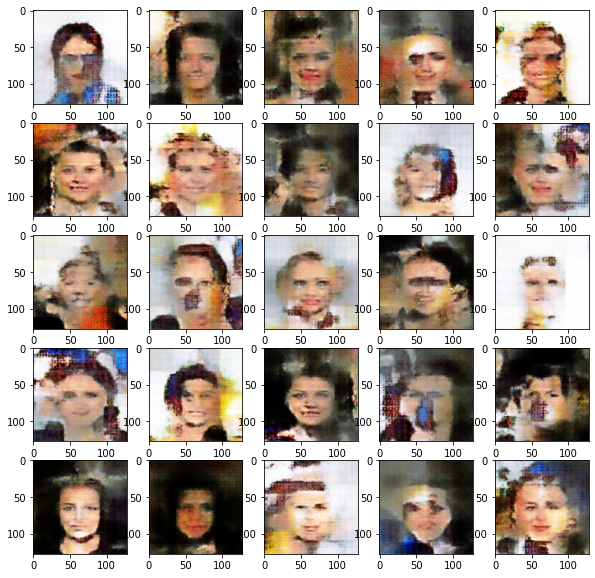

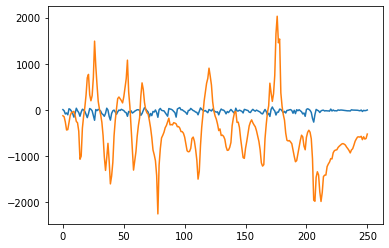



 16%|█▌        | 251/1583 [07:17<54:56,  2.47s/it]

 16%|█▌        | 252/1583 [07:18<46:29,  2.10s/it]

 16%|█▌        | 253/1583 [07:19<43:12,  1.95s/it]

 16%|█▌        | 254/1583 [07:21<40:52,  1.85s/it]

 16%|█▌        | 255/1583 [07:23<39:15,  1.77s/it]

 16%|█▌        | 256/1583 [07:24<38:05,  1.72s/it]

 16%|█▌        | 257/1583 [07:26<37:18,  1.69s/it]

 16%|█▋        | 258/1583 [07:27<36:44,  1.66s/it]

 16%|█▋        | 259/1583 [07:29<36:22,  1.65s/it]

 16%|█▋        | 260/1583 [07:31<36:03,  1.64s/it]

 16%|█▋        | 261/1583 [07:32<35:50,  1.63s/it]

 17%|█▋        | 262/1583 [07:34<35:41,  1.62s/it]

 17%|█▋        | 263/1583 [07:35<35:34,  1.62s/it]

 17%|█▋        | 264/1583 [07:37<35:28,  1.61s/it]

 17%|█▋        | 265/1583 [07:39<35:25,  1.61s/it]

 17%|█▋        | 266/1583 [07:40<35:20,  1.61s/it]

 17%|█▋        | 267/1583 [07:42<35:18,  1.61s/it]

 17%|█▋        | 268/1583 [07:43<35:15,  1.61s/it]

 17%|█▋        | 269/1583 [07:45<35:15,  1.61s/it]

 17%|█▋   

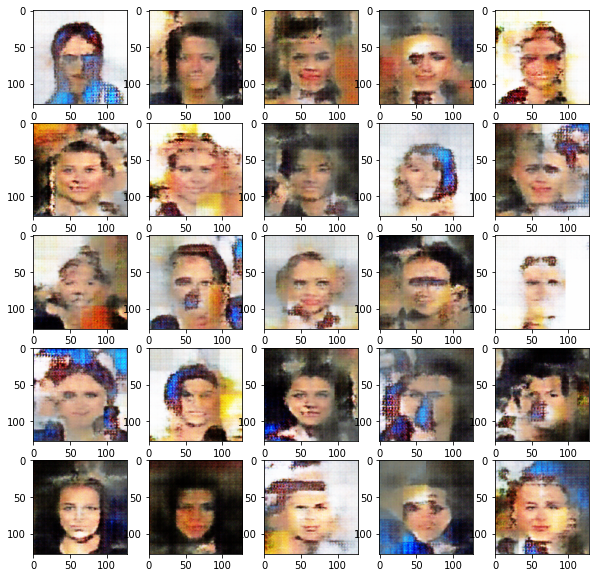

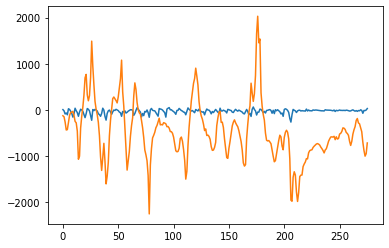



 17%|█▋        | 276/1583 [07:59<52:37,  2.42s/it]

 17%|█▋        | 277/1583 [08:00<44:42,  2.05s/it]

 18%|█▊        | 278/1583 [08:02<41:44,  1.92s/it]

 18%|█▊        | 279/1583 [08:03<39:40,  1.83s/it]

 18%|█▊        | 280/1583 [08:05<38:12,  1.76s/it]

 18%|█▊        | 281/1583 [08:07<37:09,  1.71s/it]

 18%|█▊        | 282/1583 [08:08<36:27,  1.68s/it]

 18%|█▊        | 283/1583 [08:10<35:56,  1.66s/it]

 18%|█▊        | 284/1583 [08:11<35:34,  1.64s/it]

 18%|█▊        | 285/1583 [08:13<35:19,  1.63s/it]

 18%|█▊        | 286/1583 [08:15<35:08,  1.63s/it]

 18%|█▊        | 287/1583 [08:16<35:00,  1.62s/it]

 18%|█▊        | 288/1583 [08:18<34:54,  1.62s/it]

 18%|█▊        | 289/1583 [08:19<34:49,  1.61s/it]

 18%|█▊        | 290/1583 [08:21<34:45,  1.61s/it]

 18%|█▊        | 291/1583 [08:23<34:40,  1.61s/it]

 18%|█▊        | 292/1583 [08:24<34:38,  1.61s/it]

 19%|█▊        | 293/1583 [08:26<34:35,  1.61s/it]

 19%|█▊        | 294/1583 [08:28<34:32,  1.61s/it]

 19%|█▊   

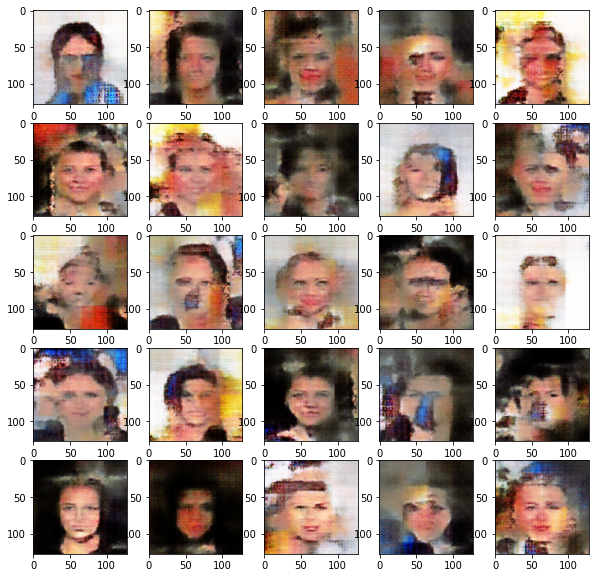

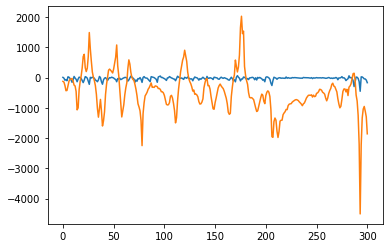



 19%|█▉        | 301/1583 [08:42<52:53,  2.48s/it]

 19%|█▉        | 302/1583 [08:43<44:51,  2.10s/it]

 19%|█▉        | 303/1583 [08:45<41:40,  1.95s/it]

 19%|█▉        | 304/1583 [08:46<39:24,  1.85s/it]

 19%|█▉        | 305/1583 [08:48<37:47,  1.77s/it]

 19%|█▉        | 306/1583 [08:49<36:40,  1.72s/it]

 19%|█▉        | 307/1583 [08:51<35:54,  1.69s/it]

 19%|█▉        | 308/1583 [08:53<35:21,  1.66s/it]

 20%|█▉        | 309/1583 [08:54<34:56,  1.65s/it]

 20%|█▉        | 310/1583 [08:56<34:38,  1.63s/it]

 20%|█▉        | 311/1583 [08:57<34:25,  1.62s/it]

 20%|█▉        | 312/1583 [08:59<34:18,  1.62s/it]

 20%|█▉        | 313/1583 [09:01<34:12,  1.62s/it]

 20%|█▉        | 314/1583 [09:02<34:07,  1.61s/it]

 20%|█▉        | 315/1583 [09:04<34:04,  1.61s/it]

 20%|█▉        | 316/1583 [09:05<33:59,  1.61s/it]

 20%|██        | 317/1583 [09:07<33:56,  1.61s/it]

 20%|██        | 318/1583 [09:09<33:54,  1.61s/it]

 20%|██        | 319/1583 [09:10<33:52,  1.61s/it]

 20%|██   

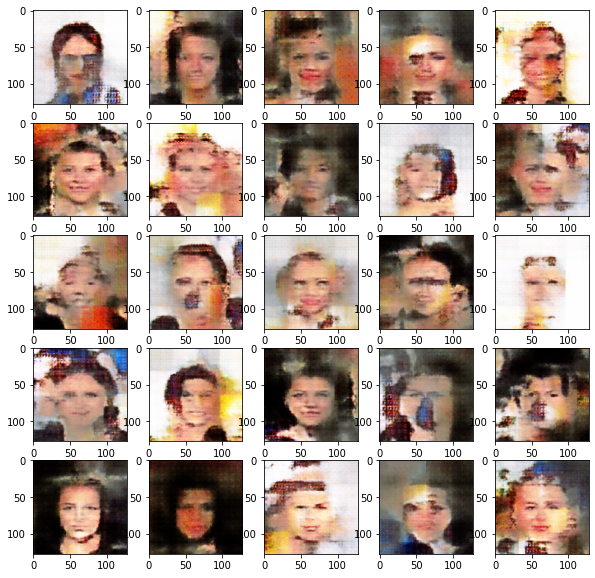

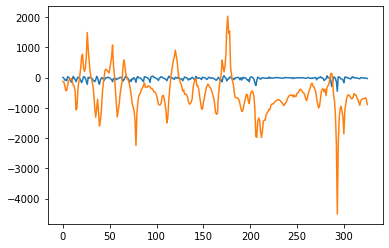



 21%|██        | 326/1583 [09:24<50:35,  2.41s/it]

 21%|██        | 327/1583 [09:25<43:04,  2.06s/it]

 21%|██        | 328/1583 [09:27<40:12,  1.92s/it]

 21%|██        | 329/1583 [09:29<38:11,  1.83s/it]

 21%|██        | 330/1583 [09:30<36:46,  1.76s/it]

 21%|██        | 331/1583 [09:32<35:46,  1.71s/it]

 21%|██        | 332/1583 [09:33<35:06,  1.68s/it]

 21%|██        | 333/1583 [09:35<34:36,  1.66s/it]

 21%|██        | 334/1583 [09:37<34:16,  1.65s/it]

 21%|██        | 335/1583 [09:38<33:59,  1.63s/it]

 21%|██        | 336/1583 [09:40<33:49,  1.63s/it]

 21%|██▏       | 337/1583 [09:41<33:40,  1.62s/it]

 21%|██▏       | 338/1583 [09:43<33:34,  1.62s/it]

 21%|██▏       | 339/1583 [09:45<33:29,  1.62s/it]

 21%|██▏       | 340/1583 [09:46<33:24,  1.61s/it]

 22%|██▏       | 341/1583 [09:48<33:21,  1.61s/it]

 22%|██▏       | 342/1583 [09:50<33:20,  1.61s/it]

 22%|██▏       | 343/1583 [09:51<33:19,  1.61s/it]

 22%|██▏       | 344/1583 [09:53<33:17,  1.61s/it]

 22%|██▏  

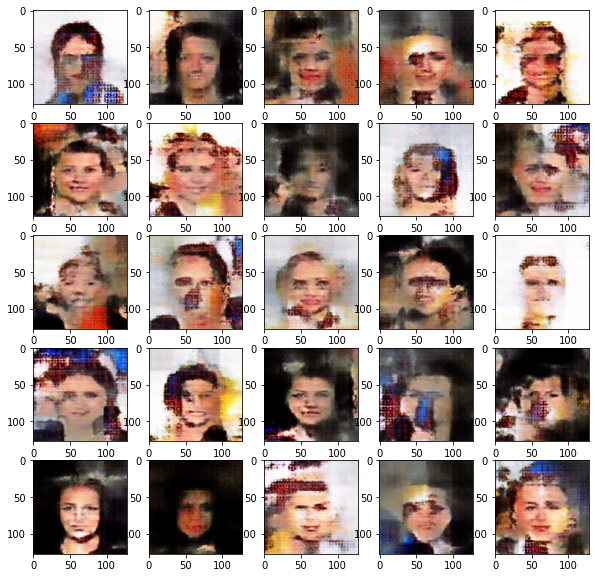

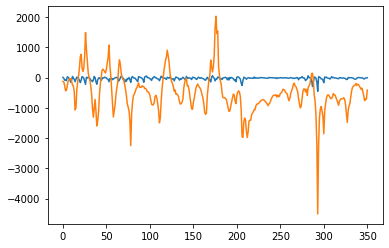



 22%|██▏       | 351/1583 [10:07<51:06,  2.49s/it]

 22%|██▏       | 352/1583 [10:08<43:10,  2.10s/it]

 22%|██▏       | 353/1583 [10:10<40:05,  1.96s/it]

 22%|██▏       | 354/1583 [10:11<37:53,  1.85s/it]

 22%|██▏       | 355/1583 [10:13<36:20,  1.78s/it]

 22%|██▏       | 356/1583 [10:15<35:14,  1.72s/it]

 23%|██▎       | 357/1583 [10:16<34:27,  1.69s/it]

 23%|██▎       | 358/1583 [10:18<33:57,  1.66s/it]

 23%|██▎       | 359/1583 [10:19<33:34,  1.65s/it]

 23%|██▎       | 360/1583 [10:21<33:17,  1.63s/it]

 23%|██▎       | 361/1583 [10:23<33:06,  1.63s/it]

 23%|██▎       | 362/1583 [10:24<32:57,  1.62s/it]

 23%|██▎       | 363/1583 [10:26<32:49,  1.61s/it]

 23%|██▎       | 364/1583 [10:27<32:44,  1.61s/it]

 23%|██▎       | 365/1583 [10:29<32:40,  1.61s/it]

 23%|██▎       | 366/1583 [10:31<32:37,  1.61s/it]

 23%|██▎       | 367/1583 [10:32<32:33,  1.61s/it]

 23%|██▎       | 368/1583 [10:34<32:32,  1.61s/it]

 23%|██▎       | 369/1583 [10:35<32:30,  1.61s/it]

 23%|██▎  

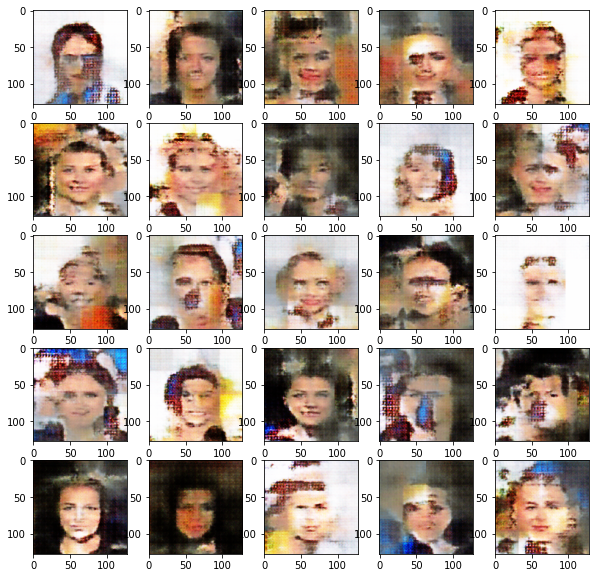

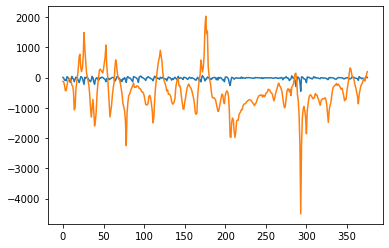



 24%|██▍       | 376/1583 [10:49<48:17,  2.40s/it]

 24%|██▍       | 377/1583 [10:51<41:05,  2.04s/it]

 24%|██▍       | 378/1583 [10:52<38:25,  1.91s/it]

 24%|██▍       | 379/1583 [10:54<36:31,  1.82s/it]

 24%|██▍       | 380/1583 [10:55<35:10,  1.75s/it]

 24%|██▍       | 381/1583 [10:57<34:13,  1.71s/it]

 24%|██▍       | 382/1583 [10:59<33:33,  1.68s/it]

 24%|██▍       | 383/1583 [11:00<33:05,  1.65s/it]

 24%|██▍       | 384/1583 [11:02<32:46,  1.64s/it]

 24%|██▍       | 385/1583 [11:03<32:32,  1.63s/it]

 24%|██▍       | 386/1583 [11:05<32:22,  1.62s/it]

 24%|██▍       | 387/1583 [11:07<32:15,  1.62s/it]

KeyboardInterrupt: ignored

In [ ]:
dislosses=[]
genlosses=[]
i=0
for e in range(100):
  for real in tqdm(train_generator):
    real=(real[0]-0.5)*2.
    disloss,genloss=train_step(real)
    dislosses.append(disloss)
    genlosses.append(genloss)
    if i%25==0:
      showout(gen(seed))
      plt.plot(dislosses)
      plt.plot(genlosses)
      plt.show()
    if i%500==0 and i>1:
      dis.save_weights('/content/'+str(i)+'dis.h5')
      gen.save_weights('/content/'+str(i)+'gen.h5')
    i+=1

In [ ]:
cdis.save_weights('/content/dis.h5')
gen.save_weights('/content/gen.h5')

In [ ]:
dis.load_weights('/content/1500dis.h5')
gen.load_weights('/content/1500gen.h5')